In [1]:
import os
import multiprocessing as mp
from communotron import *

import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as ticker

#sns.set_theme(style="whitegrid", context='talk', font_scale=1., font="Helvetica")
sns.set_theme(style='ticks', context='talk', font_scale=2.5, font="Helvetica")

In [11]:
def pred_func(pred_par_a, pred_par_b, age):
    return pred_par_b * np.exp(-pred_par_a * age)

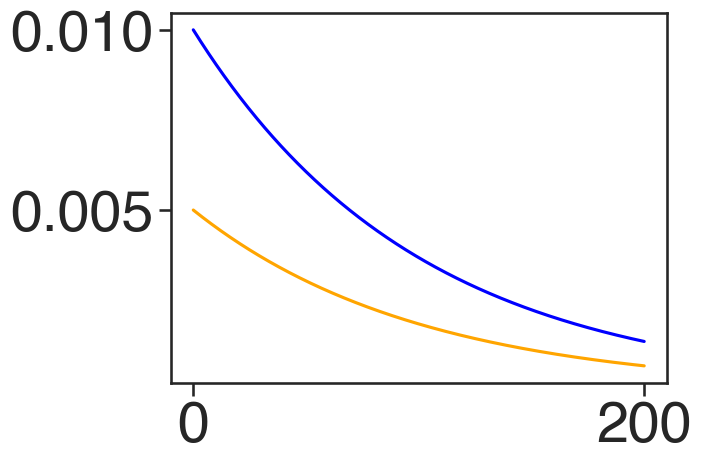

In [16]:
x = np.linspace(0, 200, 1000)
plt.plot(x, pred_func(0.01, 0.01, x), label='a=0.01, b=1', color='blue')
plt.plot(x, pred_func(0.01, 0.005, x), label='a=0.02, b=1', color='orange')

In [2]:
def simpsons_index(counts):
    """
    Given an array of nonnegative counts,
    compute 1 - sum((counts / sum(counts))^2).
    """
    counts = np.asarray(counts, dtype=float)
    total = counts.sum()
    if total == 0:
        return 0.0
    p = counts / total
    return 1 - np.sum(p**2)

In [8]:
equal_dauer_exit = True
if not equal_dauer_exit:
    dev_pars = {'A': {0: 48, 1:72, 4:72, 5:24}, 'B':{0: 48, 1:96, 4:96, 5:24}, 'C':{0: 48, 1:120, 4:24, 5:24}}
else:
    dev_pars = {'A': {0: 48, 1:72, 4:24, 5:24}, 'B':{0: 48, 1:96, 4:24, 5:24}, 'C':{0: 48, 1:120, 4:24, 5:24}}

In [9]:
dev_pars

{'A': {0: 48, 1: 72, 4: 24, 5: 24},
 'B': {0: 48, 1: 96, 4: 24, 5: 24},
 'C': {0: 48, 1: 120, 4: 24, 5: 24}}

In [ ]:
%ls ./Raw/april2025/

EnA10_EnB10_EnC200_size101_mStep10_pPred0.005_period300_Tsim1000__Tlim300_equal_dauer_exitFalse/
EnA10_EnB10_EnC200_size101_mStep10_pPred0.005_period300_Tsim1000__Tlim300_equal_dauer_exitTrue/


In [17]:
combined_df

,Unnamed: 0,E,J,A,Dead,Dauer,AJ,fE,fJ,fA,...,fDauer,fAJ,killed,cum_migrated,cum_migrated_f,Strain,Time,Resource,sim,total
0,0,0,0,0,0,13,0,0.0,0.0,0.0,...,0.052209,0.000000,0,0,0.000000,A,0,0.0,0,13
1,0,0,0,0,0,11,0,0.0,0.0,0.0,...,0.044177,0.000000,0,0,0.000000,B,0,0.0,0,11
2,0,0,0,0,0,225,0,0.0,0.0,0.0,...,0.903614,0.000000,0,0,0.000000,C,0,0.0,0,225
3,0,0,0,0,0,13,0,0.0,0.0,0.0,...,0.052209,0.000000,0,0,0.000000,A,0,0.0,0,13
4,0,0,0,0,0,11,0,0.0,0.0,0.0,...,0.044177,0.000000,0,0,0.000000,B,0,0.0,0,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
300295,0,0,0,0,42,277,5488,0.0,0.0,0.0,...,0.211774,0.192555,0,189,0.189000,B,998,0.0,99,5765
300296,0,0,0,0,207,846,19694,0.0,0.0,0.0,...,0.646789,0.690993,0,695,0.695000,C,998,0.0,99,20540
300297,0,0,0,0,38,185,3319,0.0,0.0,0.0,...,0.141871,0.116452,0,116,0.115538,A,999,0.0,99,3504
300298,0,0,0,0,42,276,5488,0.0,0.0,0.0,...,0.211656,0.192555,0,190,0.189243,B,999,0.0,99,5764


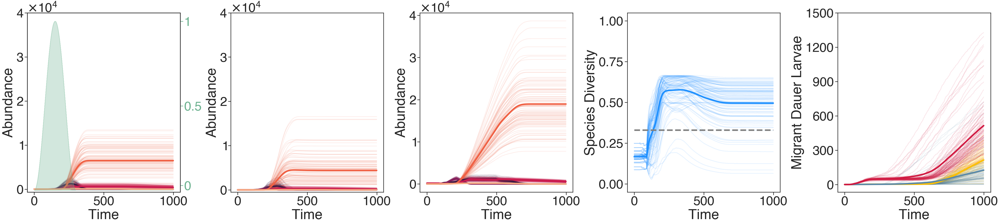

In [4]:
folder_path = '././Raw/april2025/EnA10_EnB10_EnC200_size101_mStep10_pPred0.005_period300_Tsim1000__Tlim300_equal_dauer_exitFalse/'
    
    # List to store DataFrames
dataframes = []


cols = [(0.29215894, 0.76144162, 0.67886578), (0.95922872, 0.53307513, 0.3748895), 'dodgerblue']
count = 0
for file_name in os.listdir(folder_path):
    if file_name.endswith('.csv'):
        file_path = os.path.join(folder_path, file_name)
        # Read the CSV file and append the DataFrame to the list
        df = pd.read_csv(file_path)
        df['sim'] = count
        dataframes.append(df)
        count += 1
combined_df = pd.concat(dataframes, ignore_index=True)

combined_df["total"] = combined_df["E"] + combined_df["J"] + combined_df["A"] + combined_df["Dauer"] + combined_df["AJ"]

diversity_ind = pd.DataFrame()
for sim in combined_df["sim"].unique():
    sub1 = combined_df[combined_df["sim"]==sim]
    sub1 = sub1.iloc[3:]
    for time in sub1["Time"].unique():
        sub2 = sub1[sub1["Time"]==time]
        ind = np.round(simpsons_index(np.array(sub2['total'])), decimals=3)
        temp = pd.DataFrame({'sim': sim, 'Time': time, 'diversity_index': ind}, index=[0])
        diversity_ind = pd.concat([diversity_ind, temp], ignore_index=True)

fig, axes = plt.subplots(
    nrows=1,
    ncols=5,
    figsize=(45, 10),constrained_layout=True)

axes = axes.flatten()

# axes[0].errorbar(combined_df['Time'], combined_df['Resource'])

ax2 = axes[0].twinx()
#ax2.errorbar(combined_df['Time'], combined_df['Resource'])
ax2.fill_between(combined_df['Time'], combined_df['Resource'], 0, color=sns.color_palette("crest", n_colors=4)[0], alpha=0.3, zorder=0) 
ax2.tick_params(axis='y', which='both', color=sns.color_palette("crest", n_colors=4)[0], labelcolor=sns.color_palette("crest", n_colors=4)[0])
ax2.set_ylim(-0.01, 1.05)
ax2.set_yticks([0.03, 0.5, 1])
ax2.set_yticklabels([0, 0.5, 1])

for count, strain in enumerate(['A', 'B', 'C']):
    sub_df = combined_df[combined_df['Strain']==strain]
    sims = sub_df['sim'].unique()
    cols = sns.color_palette("rocket", n_colors=5)
    for col, dev in enumerate(['E', 'J', 'Dauer', 'AJ', 'A']):
        for i in sims:
            sub_df2 = sub_df[sub_df['sim']==i]
            axes[count].plot(sub_df2['Time'], sub_df2[dev], color=cols[col], alpha=0.1, zorder=1)
        if strain == 'A':
            axes[count].plot(sub_df.groupby('Time')[dev].mean(), color=cols[col], lw=5, zorder=4)
        else:
            axes[count].plot(sub_df.groupby('Time')[dev].mean(), color=cols[col], lw=5, zorder=4)
        
# axes[0].legend(frameon=False)
sims = sub_df['sim'].unique()
for i in sims:
    temp = diversity_ind[diversity_ind['sim']==i]
    axes[3].plot(temp['Time'], temp['diversity_index'], color='dodgerblue', alpha=0.1)
axes[3].plot(diversity_ind.groupby('Time')['diversity_index'].mean(), color='dodgerblue', lw=5, zorder=4)
axes[3].plot(temp['Time'], [0.33 for i in range(len(temp['Time']))], color='gray', ls='--', lw=5, zorder=4)
axes[3].set_yticks(np.linspace(0, 1, 5))
axes[3].set_ylim(-0.05, 1.05)

formatter = ticker.ScalarFormatter(useMathText=True)
formatter.set_powerlimits((0, 0))  # Force scientific notation at all magnitudes

axes[1].set_yticks([0, 5000, 10000, 15000])
axes[1].set_ylim(-500, 15000+500)

axes[0].set_yticks(np.linspace(0, 15000, 4))

for ax in axes[:3]:
    #ax.ticklabel_format(style='sci', axis='y', scilimits=(0, 0))
    ax.yaxis.set_major_formatter(formatter)

 
cols = [(1.0, 0.75, 0.0), (0.36, 0.54, 0.66), (0.82, 0.1, 0.26)]
for count, strain in enumerate(['A', 'B', 'C']):
    sub_df = combined_df[combined_df['Strain']==strain]
    sims = sub_df['sim'].unique()
    for i in sims:
        sub_df2 = sub_df[sub_df['sim']==i]
        axes[-1].plot(sub_df2['Time'], sub_df2['cum_migrated'],  color=cols[count], alpha=0.1, zorder=1)
    axes[-1].plot(sub_df.groupby('Time')['cum_migrated'].mean(), color=cols[count], lw=5, zorder=4)

for ax in axes:
    ax.set_xlabel('Time')

for ax in axes[:3]:
    ax.set_ylabel('Abundance')

axes[3].set_ylabel('Species Diversity')
axes[-1].set_ylabel('Migrant Dauer Larvae')

axes[0].set_yticks(np.linspace(0, 40000, 5))
axes[1].set_yticks(np.linspace(0, 40000, 5))
axes[2].set_yticks(np.linspace(0, 40000, 5))

# lg = axes[0].legend(loc=(0.7,0.6), frameon=False, markerscale=0, handlelength=0, handleheight=0.1, labelcolor='linecolor', prop={'weight':'normal', 'size':'small'})

axes[-1].set_yticks(np.linspace(0, 1500, 6))

# plt.savefig('./fin_figures/fig2c.pdf', bbox_inches='tight', dpi=200)
# plt.show()


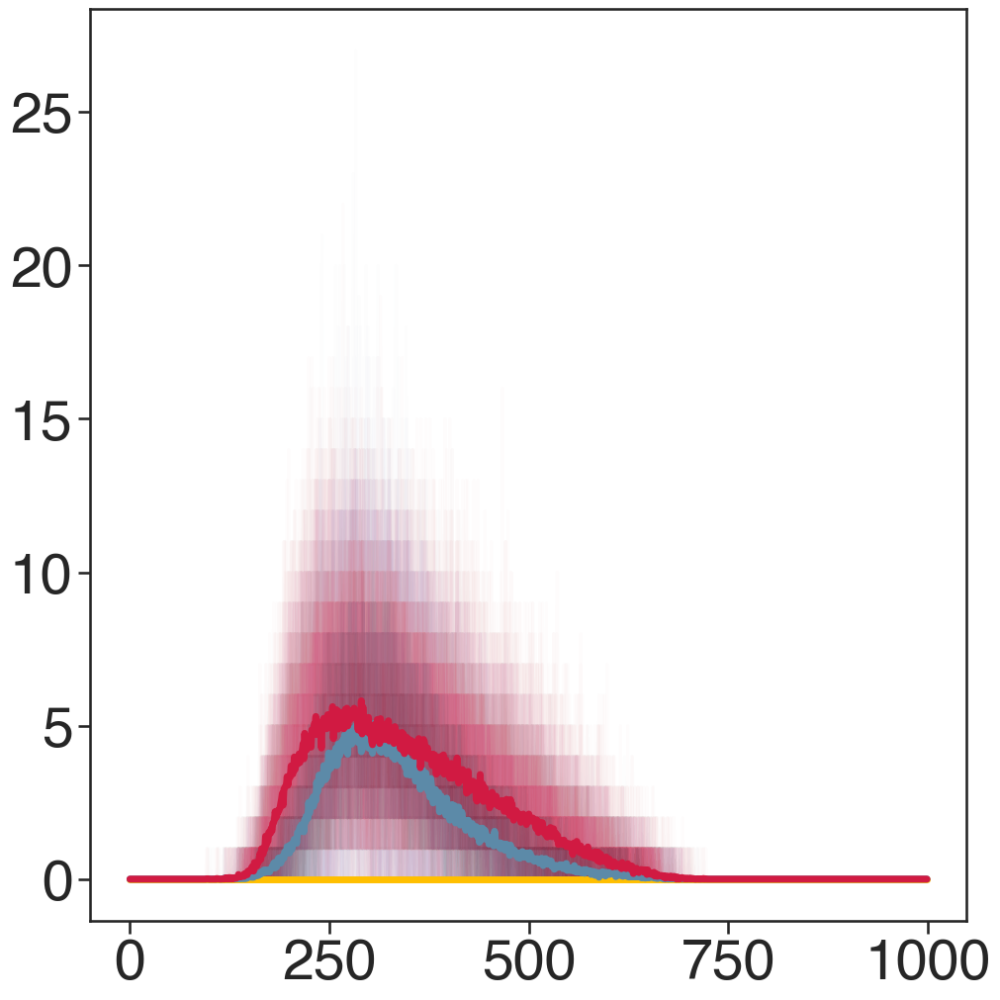

In [20]:
fig, ax = plt.subplots(
    nrows=1,
    ncols=1,
    figsize=(10, 10),constrained_layout=True)

cols = [(1.0, 0.75, 0.0), (0.36, 0.54, 0.66), (0.82, 0.1, 0.26)]
for count, strain in enumerate(['A', 'B', 'C']):
    sub_df = combined_df[combined_df['Strain']==strain]
    sims = sub_df['sim'].unique()
    for i in sims:
        sub_df2 = sub_df[sub_df['sim']==i]
        ax.plot(sub_df2['Time'], sub_df2['killed'],  color=cols[count], alpha=0.01, zorder=1)
    ax.plot(sub_df.groupby('Time')['killed'].mean(), color=cols[count], lw=5, zorder=4)


In [24]:
temp =[]
sub_df = combined_df[combined_df['Strain']=="C"]
sims = sub_df['sim'].unique()
for i in sims:
    sub_df2 = sub_df[sub_df['sim']==i]
    temp.append(np.sum(sub_df2['killed']))

{'whiskers': [<matplotlib.lines.Line2D at 0x337ff0920>,
 'caps': [<matplotlib.lines.Line2D at 0x337ff0470>,
 'boxes': [<matplotlib.lines.Line2D at 0x337ff10d0>],
 'medians': [<matplotlib.lines.Line2D at 0x337ff0dd0>],
 'fliers': [<matplotlib.lines.Line2D at 0x337ff1310>],
 'means': []}

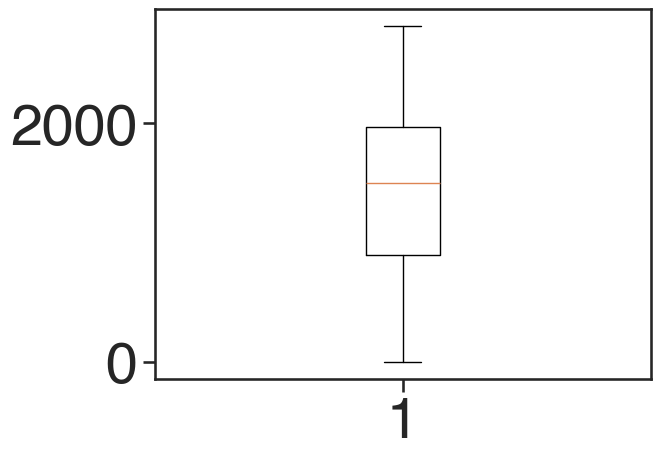

In [25]:
plt.boxplot(temp)

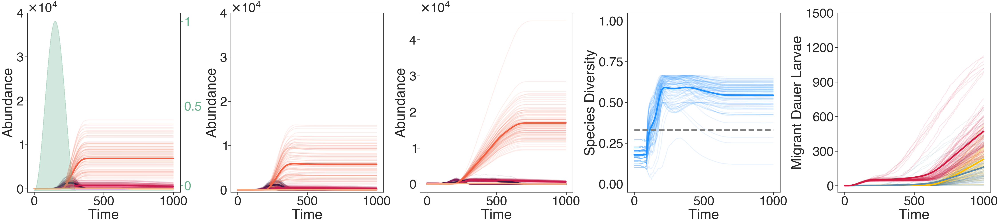

In [10]:
folder_path = '././Raw/april2025/EnA10_EnB10_EnC200_size101_mStep10_pPred0.005_period300_Tsim1000__Tlim300_equal_dauer_exitTrue/'
    
    # List to store DataFrames
dataframes = []


cols = [(0.29215894, 0.76144162, 0.67886578), (0.95922872, 0.53307513, 0.3748895), 'dodgerblue']
count = 0
for file_name in os.listdir(folder_path):
    if file_name.endswith('.csv'):
        file_path = os.path.join(folder_path, file_name)
        # Read the CSV file and append the DataFrame to the list
        df = pd.read_csv(file_path)
        df['sim'] = count
        dataframes.append(df)
        count += 1
combined_df = pd.concat(dataframes, ignore_index=True)

combined_df["total"] = combined_df["E"] + combined_df["J"] + combined_df["A"] + combined_df["Dauer"] + combined_df["AJ"]

diversity_ind = pd.DataFrame()
for sim in combined_df["sim"].unique():
    sub1 = combined_df[combined_df["sim"]==sim]
    sub1 = sub1.iloc[3:]
    for time in sub1["Time"].unique():
        sub2 = sub1[sub1["Time"]==time]
        ind = np.round(simpsons_index(np.array(sub2['total'])), decimals=3)
        temp = pd.DataFrame({'sim': sim, 'Time': time, 'diversity_index': ind}, index=[0])
        diversity_ind = pd.concat([diversity_ind, temp], ignore_index=True)

fig, axes = plt.subplots(
    nrows=1,
    ncols=5,
    figsize=(45, 10),constrained_layout=True)

axes = axes.flatten()

# axes[0].errorbar(combined_df['Time'], combined_df['Resource'])

ax2 = axes[0].twinx()
#ax2.errorbar(combined_df['Time'], combined_df['Resource'])
ax2.fill_between(combined_df['Time'], combined_df['Resource'], 0, color=sns.color_palette("crest", n_colors=4)[0], alpha=0.3, zorder=0) 
ax2.tick_params(axis='y', which='both', color=sns.color_palette("crest", n_colors=4)[0], labelcolor=sns.color_palette("crest", n_colors=4)[0])
ax2.set_ylim(-0.01, 1.05)
ax2.set_yticks([0.03, 0.5, 1])
ax2.set_yticklabels([0, 0.5, 1])

for count, strain in enumerate(['A', 'B', 'C']):
    sub_df = combined_df[combined_df['Strain']==strain]
    sims = sub_df['sim'].unique()
    cols = sns.color_palette("rocket", n_colors=5)
    for col, dev in enumerate(['E', 'J', 'Dauer', 'AJ', 'A']):
        for i in sims:
            sub_df2 = sub_df[sub_df['sim']==i]
            axes[count].plot(sub_df2['Time'], sub_df2[dev], color=cols[col], alpha=0.1, zorder=1)
        if strain == 'A':
            axes[count].plot(sub_df.groupby('Time')[dev].mean(), color=cols[col], lw=5, zorder=4)
        else:
            axes[count].plot(sub_df.groupby('Time')[dev].mean(), color=cols[col], lw=5, zorder=4)
        
# axes[0].legend(frameon=False)
sims = sub_df['sim'].unique()
for i in sims:
    temp = diversity_ind[diversity_ind['sim']==i]
    axes[3].plot(temp['Time'], temp['diversity_index'], color='dodgerblue', alpha=0.1)
axes[3].plot(diversity_ind.groupby('Time')['diversity_index'].mean(), color='dodgerblue', lw=5, zorder=4)
axes[3].plot(temp['Time'], [0.33 for i in range(len(temp['Time']))], color='gray', ls='--', lw=5, zorder=4)
axes[3].set_yticks(np.linspace(0, 1, 5))
axes[3].set_ylim(-0.05, 1.05)

formatter = ticker.ScalarFormatter(useMathText=True)
formatter.set_powerlimits((0, 0))  # Force scientific notation at all magnitudes

axes[1].set_yticks([0, 5000, 10000, 15000])
axes[1].set_ylim(-500, 15000+500)

axes[0].set_yticks(np.linspace(0, 15000, 4))

for ax in axes[:3]:
    #ax.ticklabel_format(style='sci', axis='y', scilimits=(0, 0))
    ax.yaxis.set_major_formatter(formatter)

 
cols = [(1.0, 0.75, 0.0), (0.36, 0.54, 0.66), (0.82, 0.1, 0.26)]
for count, strain in enumerate(['A', 'B', 'C']):
    sub_df = combined_df[combined_df['Strain']==strain]
    sims = sub_df['sim'].unique()
    for i in sims:
        sub_df2 = sub_df[sub_df['sim']==i]
        axes[-1].plot(sub_df2['Time'], sub_df2['cum_migrated'],  color=cols[count], alpha=0.1, zorder=1)
    axes[-1].plot(sub_df.groupby('Time')['cum_migrated'].mean(), color=cols[count], lw=5, zorder=4)

for ax in axes:
    ax.set_xlabel('Time')

for ax in axes[:3]:
    ax.set_ylabel('Abundance')

axes[3].set_ylabel('Species Diversity')
axes[-1].set_ylabel('Migrant Dauer Larvae')

axes[0].set_yticks(np.linspace(0, 40000, 5))
axes[1].set_yticks(np.linspace(0, 40000, 5))
axes[2].set_yticks(np.linspace(0, 40000, 5))

# lg = axes[0].legend(loc=(0.7,0.6), frameon=False, markerscale=0, handlelength=0, handleheight=0.1, labelcolor='linecolor', prop={'weight':'normal', 'size':'small'})

axes[-1].set_yticks(np.linspace(0, 1500, 6))

# plt.savefig('./fin_figures/fig2c.pdf', bbox_inches='tight', dpi=200)
# plt.show()


In [ ]:
folder_path = './output/stats/Jan2025/EnA10_EnB10_EnC200_size101_mStep10_pPred0.005_period300_Tsim1000_depletionTrue'
    
    # List to store DataFrames
dataframes = []


cols = [(0.29215894, 0.76144162, 0.67886578), (0.95922872, 0.53307513, 0.3748895), 'dodgerblue']
count = 0
for file_name in os.listdir(folder_path):
    if file_name.endswith('.csv'):
        file_path = os.path.join(folder_path, file_name)
        # Read the CSV file and append the DataFrame to the list
        df = pd.read_csv(file_path)
        df['sim'] = count
        dataframes.append(df)
        count += 1
combined_df = pd.concat(dataframes, ignore_index=True)

In [ ]:
def shannon_entropy(counts):
    counts = np.asarray(counts, dtype=float)
    total = counts.sum()
    if total == 0:
        return 0.0
    probs = counts / total
    # Filter out zero entries to avoid log(0)
    probs = probs[probs > 0]
    return -np.sum(probs * np.log(probs))

In [ ]:
def simpsons_index(counts):
    """
    Given an array of nonnegative counts,
    compute 1 - sum((counts / sum(counts))^2).
    """
    counts = np.asarray(counts, dtype=float)
    total = counts.sum()
    if total == 0:
        return 0.0
    p = counts / total
    return 1 - np.sum(p**2)

In [8]:
count

60

In [9]:
np.sum(combined_df['killed'])/60

np.float64(2060.2)

In [3]:
combined_df.groupby(['sim', 'Time'])[['E', 'J', 'A', 'Dauer', 'AJ']].sum()

E  J  A  Dauer     AJ
sim Time                       
0   0     0  0  0    448      0
    1     0  0  0    224      0
    2     0  0  0    224      0
    3     0  0  0    224      0
    4     0  0  0    224      0
...      .. .. ..    ...    ...
59  995   0  0  0   1042  28510
    996   0  0  0   1040  28510
    997   0  0  0   1039  28510
    998   0  0  0   1039  28510
    999   0  0  0   1036  28510

[60000 rows x 5 columns]

In [4]:
sub_df[sub_df['sim']==1]['AJ'].plot()

NameError: name 'sub_df' is not defined

In [ ]:
sub1 = combined_df[combined_df["sim"]==0]
sub1 = sub1.iloc[3:]
sub1["total"] = sub1["E"] + sub1["J"] + sub1["A"] + sub1["Dauer"] + sub1["AJ"]

In [ ]:
combined_df["total"] = combined_df["E"] + combined_df["J"] + combined_df["A"] + combined_df["Dauer"] + combined_df["AJ"]

In [ ]:
combined_df

,Unnamed: 0,E,J,A,Dead,Dauer,AJ,fE,fJ,fA,...,fDauer,fAJ,killed,cum_migrated,cum_migrated_f,Strain,Time,Resource,sim,total
0,0,0,0,0,0,13,0,0.0,0.0,0.0,...,0.058036,0.000000,0,0,0.000000,A,0,0.002739,0,13
1,0,0,0,0,0,14,0,0.0,0.0,0.0,...,0.062500,0.000000,0,0,0.000000,B,0,0.002739,0,14
2,0,0,0,0,0,197,0,0.0,0.0,0.0,...,0.879464,0.000000,0,0,0.000000,C,0,0.002739,0,197
3,0,0,0,0,0,13,0,0.0,0.0,0.0,...,0.058036,0.000000,0,0,0.000000,A,0,0.002739,0,13
4,0,0,0,0,0,14,0,0.0,0.0,0.0,...,0.062500,0.000000,0,0,0.000000,B,0,0.002739,0,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180175,0,0,0,0,13,63,1627,0.0,0.0,0.0,...,0.060635,0.057068,0,46,0.051977,B,998,0.000000,59,1690
180176,0,0,0,0,184,706,20736,0.0,0.0,0.0,...,0.679500,0.727324,0,637,0.719774,C,998,0.000000,59,21442
180177,0,0,0,0,66,269,6147,0.0,0.0,0.0,...,0.259653,0.215609,0,203,0.228604,A,999,0.000000,59,6416
180178,0,0,0,0,13,62,1627,0.0,0.0,0.0,...,0.059846,0.057068,0,47,0.052928,B,999,0.000000,59,1689


In [ ]:
diversity_ind = pd.DataFrame()
for sim in combined_df["sim"].unique():
    sub1 = combined_df[combined_df["sim"]==sim]
    sub1 = sub1.iloc[3:]
    for time in sub1["Time"].unique():
        sub2 = sub1[sub1["Time"]==time]
        ind = np.round(simpsons_index(np.array(sub2['total'])), decimals=3)
        temp = pd.DataFrame({'sim': sim, 'Time': time, 'diversity_index': ind}, index=[0])
        diversity_ind = pd.concat([diversity_ind, temp], ignore_index=True)


<Axes: xlabel='Time'>

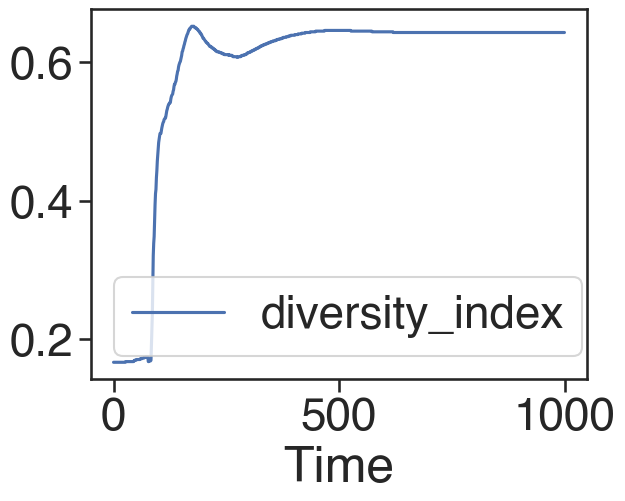

In [ ]:
diversity_ind[diversity_ind['sim']==3].plot(x='Time', y='diversity_index')

/var/folders/b4/rkn0k8wd3cb6887fxs1vrp6m0007jh/T/ipykernel_41039/2333248416.py:106: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  lg = axes[0].legend(loc=(0.7,0.6), frameon=False, markerscale=0, handlelength=0, handleheight=0.1, labelcolor='linecolor', prop={'weight':'normal', 'size':'small'})


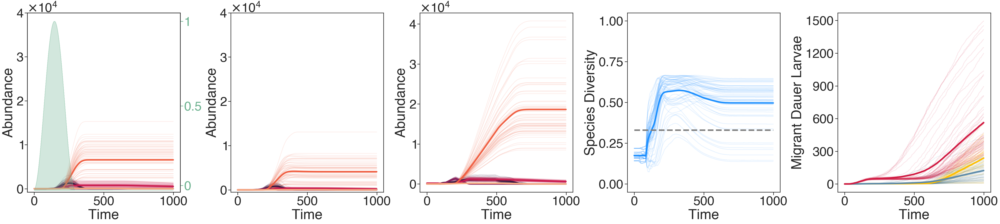

In [ ]:
folder_path = './output/stats/Jan2025/EnA10_EnB10_EnC200_size101_mStep10_pPred0.005_period300_Tsim1000_depletionTrue'
    
    # List to store DataFrames
dataframes = []


cols = [(0.29215894, 0.76144162, 0.67886578), (0.95922872, 0.53307513, 0.3748895), 'dodgerblue']
count = 0
for file_name in os.listdir(folder_path):
    if file_name.endswith('.csv'):
        file_path = os.path.join(folder_path, file_name)
        # Read the CSV file and append the DataFrame to the list
        df = pd.read_csv(file_path)
        df['sim'] = count
        dataframes.append(df)
        count += 1
combined_df = pd.concat(dataframes, ignore_index=True)

combined_df["total"] = combined_df["E"] + combined_df["J"] + combined_df["A"] + combined_df["Dauer"] + combined_df["AJ"]

diversity_ind = pd.DataFrame()
for sim in combined_df["sim"].unique():
    sub1 = combined_df[combined_df["sim"]==sim]
    sub1 = sub1.iloc[3:]
    for time in sub1["Time"].unique():
        sub2 = sub1[sub1["Time"]==time]
        ind = np.round(simpsons_index(np.array(sub2['total'])), decimals=3)
        temp = pd.DataFrame({'sim': sim, 'Time': time, 'diversity_index': ind}, index=[0])
        diversity_ind = pd.concat([diversity_ind, temp], ignore_index=True)

fig, axes = plt.subplots(
    nrows=1,
    ncols=5,
    figsize=(45, 10),constrained_layout=True)

axes = axes.flatten()

# axes[0].errorbar(combined_df['Time'], combined_df['Resource'])

ax2 = axes[0].twinx()
#ax2.errorbar(combined_df['Time'], combined_df['Resource'])
ax2.fill_between(combined_df['Time'], combined_df['Resource'], 0, color=sns.color_palette("crest", n_colors=4)[0], alpha=0.3, zorder=0) 
ax2.tick_params(axis='y', which='both', color=sns.color_palette("crest", n_colors=4)[0], labelcolor=sns.color_palette("crest", n_colors=4)[0])
ax2.set_ylim(-0.01, 1.05)
ax2.set_yticks([0.03, 0.5, 1])
ax2.set_yticklabels([0, 0.5, 1])

for count, strain in enumerate(['A', 'B', 'C']):
    sub_df = combined_df[combined_df['Strain']==strain]
    sims = sub_df['sim'].unique()
    cols = sns.color_palette("rocket", n_colors=5)
    for col, dev in enumerate(['E', 'J', 'Dauer', 'AJ', 'A']):
        for i in sims:
            sub_df2 = sub_df[sub_df['sim']==i]
            axes[count].plot(sub_df2['Time'], sub_df2[dev], color=cols[col], alpha=0.1, zorder=1)
        if strain == 'A':
            axes[count].plot(sub_df.groupby('Time')[dev].mean(), color=cols[col], lw=5, zorder=4)
        else:
            axes[count].plot(sub_df.groupby('Time')[dev].mean(), color=cols[col], lw=5, zorder=4)
        
# axes[0].legend(frameon=False)
sims = sub_df['sim'].unique()
for i in sims:
    temp = diversity_ind[diversity_ind['sim']==i]
    axes[3].plot(temp['Time'], temp['diversity_index'], color='dodgerblue', alpha=0.1)
axes[3].plot(diversity_ind.groupby('Time')['diversity_index'].mean(), color='dodgerblue', lw=5, zorder=4)
axes[3].plot(temp['Time'], [0.33 for i in range(len(temp['Time']))], color='gray', ls='--', lw=5, zorder=4)
axes[3].set_yticks(np.linspace(0, 1, 5))
axes[3].set_ylim(-0.05, 1.05)

formatter = ticker.ScalarFormatter(useMathText=True)
formatter.set_powerlimits((0, 0))  # Force scientific notation at all magnitudes

axes[1].set_yticks([0, 5000, 10000, 15000])
axes[1].set_ylim(-500, 15000+500)

axes[0].set_yticks(np.linspace(0, 15000, 4))

for ax in axes[:3]:
    #ax.ticklabel_format(style='sci', axis='y', scilimits=(0, 0))
    ax.yaxis.set_major_formatter(formatter)

 
cols = [(1.0, 0.75, 0.0), (0.36, 0.54, 0.66), (0.82, 0.1, 0.26)]
for count, strain in enumerate(['A', 'B', 'C']):
    sub_df = combined_df[combined_df['Strain']==strain]
    sims = sub_df['sim'].unique()
    for i in sims:
        sub_df2 = sub_df[sub_df['sim']==i]
        axes[-1].plot(sub_df2['Time'], sub_df2['cum_migrated'],  color=cols[count], alpha=0.1, zorder=1)
    axes[-1].plot(sub_df.groupby('Time')['cum_migrated'].mean(), color=cols[count], lw=5, zorder=4)

for ax in axes:
    ax.set_xlabel('Time')

for ax in axes[:3]:
    ax.set_ylabel('Abundance')

axes[3].set_ylabel('Species Diversity')
axes[-1].set_ylabel('Migrant Dauer Larvae')

axes[0].set_yticks(np.linspace(0, 40000, 5))
axes[1].set_yticks(np.linspace(0, 40000, 5))
axes[2].set_yticks(np.linspace(0, 40000, 5))

lg = axes[0].legend(loc=(0.7,0.6), frameon=False, markerscale=0, handlelength=0, handleheight=0.1, labelcolor='linecolor', prop={'weight':'normal', 'size':'small'})

axes[-1].set_yticks(np.linspace(0, 1500, 6))

plt.savefig('./fin_figures/fig2c.pdf', bbox_inches='tight', dpi=200)
# plt.show()


In [ ]:
directory_path = "./output/stats/Jan2025/new_batch"

# Get the list of folder names in the directory
folder_names = [name for name in os.listdir(directory_path) if os.path.isdir(os.path.join(directory_path, name))]

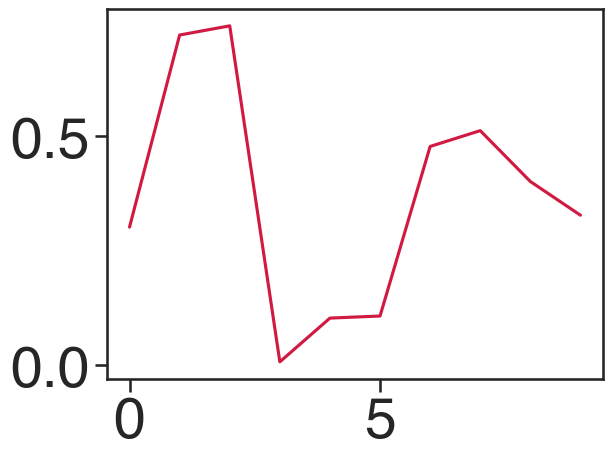

In [ ]:
plt.plot(np.random.rand(10), color=(0.82, 0.1, 0.26))

/var/folders/b4/rkn0k8wd3cb6887fxs1vrp6m0007jh/T/ipykernel_41039/441412780.py:110: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  lg = axes[0].legend(loc=(0.7,0.6), frameon=False, markerscale=0, handlelength=0, handleheight=0.1, labelcolor='linecolor', prop={'weight':'normal', 'size':'small'})


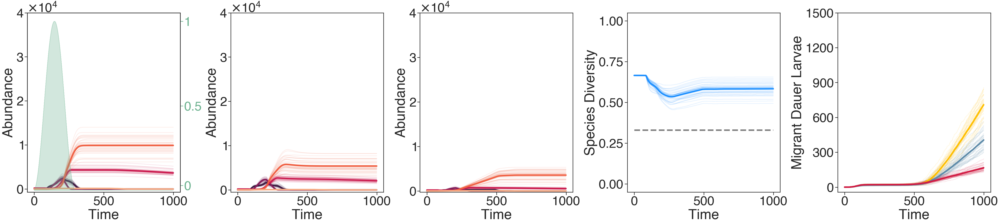

In [ ]:
folder_path = './output/stats/Jan2025/EnA200_EnB200_EnC200_size101_mStep10_pPred0.005_period300_Tsim1000_depletionTrue'
    
    # List to store DataFrames
dataframes = []


cols = [(0.29215894, 0.76144162, 0.67886578), (0.95922872, 0.53307513, 0.3748895), 'dodgerblue']
count = 0
for file_name in os.listdir(folder_path):
    if file_name.endswith('.csv'):
        file_path = os.path.join(folder_path, file_name)
        # Read the CSV file and append the DataFrame to the list
        df = pd.read_csv(file_path)
        df['sim'] = count
        dataframes.append(df)
        count += 1
combined_df = pd.concat(dataframes, ignore_index=True)

combined_df["total"] = combined_df["E"] + combined_df["J"] + combined_df["A"] + combined_df["Dauer"] + combined_df["AJ"]

diversity_ind = pd.DataFrame()
for sim in combined_df["sim"].unique():
    sub1 = combined_df[combined_df["sim"]==sim]
    sub1 = sub1.iloc[3:]
    for time in sub1["Time"].unique():
        sub2 = sub1[sub1["Time"]==time]
        ind = np.round(simpsons_index(np.array(sub2['total'])), decimals=3)
        temp = pd.DataFrame({'sim': sim, 'Time': time, 'diversity_index': ind}, index=[0])
        diversity_ind = pd.concat([diversity_ind, temp], ignore_index=True)

name = 'fig2d'

fig, axes = plt.subplots(
    nrows=1,
    ncols=5,
    figsize=(45, 10),constrained_layout=True)

axes = axes.flatten()

# axes[0].errorbar(combined_df['Time'], combined_df['Resource'])

ax2 = axes[0].twinx()
#ax2.errorbar(combined_df['Time'], combined_df['Resource'])
ax2.fill_between(combined_df['Time'], combined_df['Resource'], 0, color=sns.color_palette("crest", n_colors=4)[0], alpha=0.3, zorder=0) 

ax2.tick_params(axis='y', which='both', color=sns.color_palette("crest", n_colors=4)[0], labelcolor=sns.color_palette("crest", n_colors=4)[0])
ax2.set_ylim(-0.01, 1.05)
ax2.set_yticks([0.03, 0.5, 1])
ax2.set_yticklabels([0, 0.5, 1])


for count, strain in enumerate(['A', 'B', 'C']):
    sub_df = combined_df[combined_df['Strain']==strain]
    sims = sub_df['sim'].unique()
    cols = sns.color_palette("rocket", n_colors=5)
    for col, dev in enumerate(['E', 'J', 'Dauer', 'AJ', 'A']):
        for i in sims:
            sub_df2 = sub_df[sub_df['sim']==i]
            axes[count].plot(sub_df2['Time'], sub_df2[dev], color=cols[col], alpha=0.1, zorder=1)
        if strain == 'A':
            axes[count].plot(sub_df.groupby('Time')[dev].mean(), color=cols[col], lw=5, zorder=4)
        else:
            axes[count].plot(sub_df.groupby('Time')[dev].mean(), color=cols[col], lw=5, zorder=4)
        
# axes[0].legend(frameon=False)
sims = sub_df['sim'].unique()
for i in sims:
    temp = diversity_ind[diversity_ind['sim']==i]
    axes[3].plot(temp['Time'], temp['diversity_index'], color='dodgerblue', alpha=0.1)
axes[3].plot(diversity_ind.groupby('Time')['diversity_index'].mean(), color='dodgerblue', lw=5, zorder=4)
axes[3].plot(temp['Time'], [0.33 for i in range(len(temp['Time']))], color='gray', ls='--', lw=5, zorder=4)
axes[3].set_yticks(np.linspace(0, 1, 5))
axes[3].set_ylim(-0.05, 1.05)

formatter = ticker.ScalarFormatter(useMathText=True)
formatter.set_powerlimits((0, 0))  # Force scientific notation at all magnitudes

axes[1].set_yticks([0, 5000, 10000, 15000])
axes[1].set_ylim(-500, 15000+500)

axes[0].set_yticks(np.linspace(0, 15000, 4))

for ax in axes[:3]:
    #ax.ticklabel_format(style='sci', axis='y', scilimits=(0, 0))
    ax.yaxis.set_major_formatter(formatter)

 
cols = [(1.0, 0.75, 0.0), (0.36, 0.54, 0.66), (0.82, 0.1, 0.26)]
for count, strain in enumerate(['A', 'B', 'C']):
    sub_df = combined_df[combined_df['Strain']==strain]
    sims = sub_df['sim'].unique()
    for i in sims:
        sub_df2 = sub_df[sub_df['sim']==i]
        axes[-1].plot(sub_df2['Time'], sub_df2['cum_migrated'],  color=cols[count], alpha=0.1, zorder=1)
    axes[-1].plot(sub_df.groupby('Time')['cum_migrated'].mean(), color=cols[count], lw=5, zorder=4)

for ax in axes:
    ax.set_xlabel('Time')

for ax in axes[:3]:
    ax.set_ylabel('Abundance')

axes[3].set_ylabel('Species Diversity')
axes[-1].set_ylabel('Migrant Dauer Larvae')

axes[0].set_yticks(np.linspace(0, 40000, 5))
axes[1].set_yticks(np.linspace(0, 40000, 5))
axes[2].set_yticks(np.linspace(0, 40000, 5))

lg = axes[0].legend(loc=(0.7,0.6), frameon=False, markerscale=0, handlelength=0, handleheight=0.1, labelcolor='linecolor', prop={'weight':'normal', 'size':'small'})

axes[-1].set_yticks(np.linspace(0, 1500, 6))

plt.savefig('./fin_figures/'+name+'.pdf', bbox_inches='tight', dpi=200)
# plt.show()


/var/folders/b4/rkn0k8wd3cb6887fxs1vrp6m0007jh/T/ipykernel_52304/2530887877.py:111: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  lg = axes[0].legend(loc=(0.7,0.6), frameon=False, markerscale=0, handlelength=0, handleheight=0.1, labelcolor='linecolor', prop={'weight':'normal', 'size':'small'})


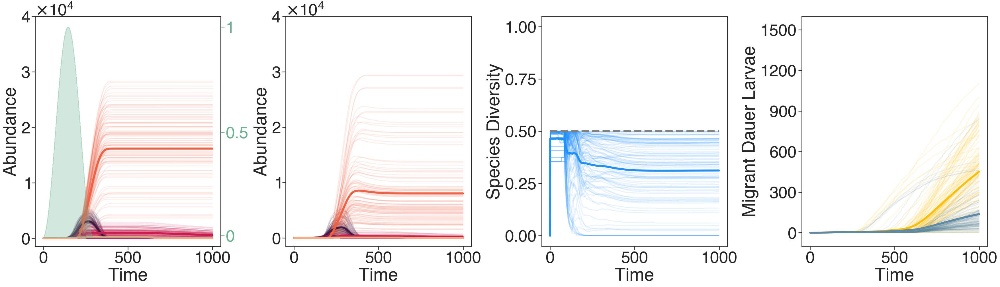

In [ ]:
folder_path = './output/stats/Jan2025/new_batch/EnA10_EnB10_EnC0_size101_mStep10_pPred0.005_period300_Tsim1000_depleteTrue_equal_dauer_exitFalse'
    
    # List to store DataFrames
dataframes = []


cols = [(0.29215894, 0.76144162, 0.67886578), (0.95922872, 0.53307513, 0.3748895), 'dodgerblue']
count = 0
for file_name in os.listdir(folder_path):
    if file_name.endswith('.csv'):
        file_path = os.path.join(folder_path, file_name)
        # Read the CSV file and append the DataFrame to the list
        df = pd.read_csv(file_path)
        df['sim'] = count
        dataframes.append(df)
        count += 1
combined_df = pd.concat(dataframes, ignore_index=True)

combined_df = combined_df[combined_df['Strain'] != 'C']

combined_df["total"] = combined_df["E"] + combined_df["J"] + combined_df["A"] + combined_df["Dauer"] + combined_df["AJ"]

diversity_ind = pd.DataFrame()
for sim in combined_df["sim"].unique():
    sub1 = combined_df[combined_df["sim"]==sim]
    sub1 = sub1.iloc[3:]
    for time in sub1["Time"].unique():
        sub2 = sub1[sub1["Time"]==time]
        ind = np.round(simpsons_index(np.array(sub2['total'])), decimals=3)
        temp = pd.DataFrame({'sim': sim, 'Time': time, 'diversity_index': ind}, index=[0])
        diversity_ind = pd.concat([diversity_ind, temp], ignore_index=True)

name = 'fig3a'

fig, axes = plt.subplots(
    nrows=1,
    ncols=4,
    figsize=(35, 10),constrained_layout=True)

axes = axes.flatten()

# axes[0].errorbar(combined_df['Time'], combined_df['Resource'])

ax2 = axes[0].twinx()
#ax2.errorbar(combined_df['Time'], combined_df['Resource'])
ax2.fill_between(combined_df['Time'], combined_df['Resource'], 0, color=sns.color_palette("crest", n_colors=4)[0], alpha=0.3, zorder=0) 
ax2.tick_params(axis='y', which='both', color=sns.color_palette("crest", n_colors=4)[0], labelcolor=sns.color_palette("crest", n_colors=4)[0])
ax2.set_ylim(-0.04, 1.05)
ax2.set_yticks([0.01, 0.5, 1])
ax2.set_yticklabels([0, 0.5, 1])


for count, strain in enumerate(['A', 'B']):
    sub_df = combined_df[combined_df['Strain']==strain]
    sims = sub_df['sim'].unique()
    cols = sns.color_palette("rocket", n_colors=5)
    for col, dev in enumerate(['E', 'J', 'Dauer', 'AJ', 'A']):
        for i in sims:
            sub_df2 = sub_df[sub_df['sim']==i]
            axes[count].plot(sub_df2['Time'], sub_df2[dev], color=cols[col], alpha=0.1, zorder=1)
        if strain == 'A':
            axes[count].plot(sub_df.groupby('Time')[dev].mean(), color=cols[col], lw=5, zorder=4)
        else:
            axes[count].plot(sub_df.groupby('Time')[dev].mean(), color=cols[col], lw=5, zorder=4)
        
# axes[0].legend(frameon=False)
sims = sub_df['sim'].unique()
for i in sims:
    temp = diversity_ind[diversity_ind['sim']==i]
    axes[2].plot(temp['Time'], temp['diversity_index'], color='dodgerblue', alpha=0.1)
axes[2].plot(diversity_ind.groupby('Time')['diversity_index'].mean(), color='dodgerblue', lw=5, zorder=4)
axes[2].plot(temp['Time'], [0.5 for i in range(len(temp['Time']))], color='gray', ls='--', lw=5, zorder=4)
axes[2].set_yticks(np.linspace(0, 1, 5))
axes[2].set_ylim(-0.05, 1.05)

formatter = ticker.ScalarFormatter(useMathText=True)
formatter.set_powerlimits((0, 0))  # Force scientific notation at all magnitudes

# axes[1].set_yticks([0, 5000, 10000, 15000])
# axes[1].set_ylim(-500, 15000+500)

# axes[0].set_yticks(np.linspace(0, 15000, 4))

for ax in axes[:2]:
    #ax.ticklabel_format(style='sci', axis='y', scilimits=(0, 0))
    ax.yaxis.set_major_formatter(formatter)

 
cols = [(1.0, 0.75, 0.0), (0.36, 0.54, 0.66), (0.82, 0.1, 0.26)]
for count, strain in enumerate(['A', 'B', 'C']):
    sub_df = combined_df[combined_df['Strain']==strain]
    sims = sub_df['sim'].unique()
    for i in sims:
        sub_df2 = sub_df[sub_df['sim']==i]
        axes[-1].plot(sub_df2['Time'], sub_df2['cum_migrated'],  color=cols[count], alpha=0.1, zorder=1)
    axes[-1].plot(sub_df.groupby('Time')['cum_migrated'].mean(), color=cols[count], lw=5, zorder=4)

for ax in axes:
    ax.set_xlabel('Time')

for ax in axes[:3]:
    ax.set_ylabel('Abundance')

axes[2].set_ylabel('Species Diversity')
axes[-1].set_ylabel('Migrant Dauer Larvae')

axes[0].set_yticks(np.linspace(0, 40000, 5))

axes[1].set_yticks(np.linspace(0, 40000, 5))

lg = axes[0].legend(loc=(0.7,0.6), frameon=False, markerscale=0, handlelength=0, handleheight=0.1, labelcolor='linecolor', prop={'weight':'normal', 'size':'small'})

axes[-1].set_yticks(np.linspace(0, 1500, 6))

axes[-1].set_ylim(-100, 1500+100)

plt.savefig('./fin_figures/'+name+'.pdf', bbox_inches='tight', dpi=200)
# plt.show()


/var/folders/b4/rkn0k8wd3cb6887fxs1vrp6m0007jh/T/ipykernel_52304/113032872.py:112: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  lg = axes[0].legend(loc=(0.7,0.6), frameon=False, markerscale=0, handlelength=0, handleheight=0.1, labelcolor='linecolor', prop={'weight':'normal', 'size':'small'})


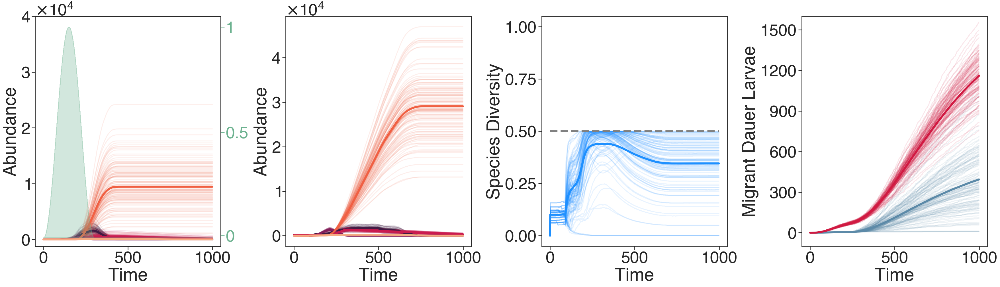

In [ ]:
folder_path = './output/stats/Jan2025/new_batch/EnA0_EnB10_EnC200_size101_mStep10_pPred0.005_period300_Tsim1000__Tlim300_equal_dauer_exitFalse'
    
    # List to store DataFrames
dataframes = []


cols = [(0.29215894, 0.76144162, 0.67886578), (0.95922872, 0.53307513, 0.3748895), 'dodgerblue']
count = 0
for file_name in os.listdir(folder_path):
    if file_name.endswith('.csv'):
        file_path = os.path.join(folder_path, file_name)
        # Read the CSV file and append the DataFrame to the list
        df = pd.read_csv(file_path)
        df['sim'] = count
        dataframes.append(df)
        count += 1
combined_df = pd.concat(dataframes, ignore_index=True)

combined_df = combined_df[combined_df['Strain'] != 'A']

combined_df["total"] = combined_df["E"] + combined_df["J"] + combined_df["A"] + combined_df["Dauer"] + combined_df["AJ"]

diversity_ind = pd.DataFrame()
for sim in combined_df["sim"].unique():
    sub1 = combined_df[combined_df["sim"]==sim]
    sub1 = sub1.iloc[3:]
    for time in sub1["Time"].unique():
        sub2 = sub1[sub1["Time"]==time]
        ind = np.round(simpsons_index(np.array(sub2['total'])), decimals=3)
        temp = pd.DataFrame({'sim': sim, 'Time': time, 'diversity_index': ind}, index=[0])
        diversity_ind = pd.concat([diversity_ind, temp], ignore_index=True)

name = 'fig3b'

fig, axes = plt.subplots(
    nrows=1,
    ncols=4,
    figsize=(35, 10),constrained_layout=True)

axes = axes.flatten()

# axes[0].errorbar(combined_df['Time'], combined_df['Resource'])

ax2 = axes[0].twinx()
#ax2.errorbar(combined_df['Time'], combined_df['Resource'])
ax2.fill_between(combined_df['Time'], combined_df['Resource'], 0, color=sns.color_palette("crest", n_colors=4)[0], alpha=0.3, zorder=0) 
ax2.tick_params(axis='y', which='both', color=sns.color_palette("crest", n_colors=4)[0], labelcolor=sns.color_palette("crest", n_colors=4)[0])
ax2.set_ylim(-0.04, 1.05)
ax2.set_yticks([0.01, 0.5, 1])
ax2.set_yticklabels([0, 0.5, 1])


for count, strain in enumerate(['B', 'C']):
    sub_df = combined_df[combined_df['Strain']==strain]
    sims = sub_df['sim'].unique()
    cols = sns.color_palette("rocket", n_colors=5)
    for col, dev in enumerate(['E', 'J', 'Dauer', 'AJ', 'A']):
        for i in sims:
            sub_df2 = sub_df[sub_df['sim']==i]
            axes[count].plot(sub_df2['Time'], sub_df2[dev], color=cols[col], alpha=0.1, zorder=1)
        if strain == 'A':
            axes[count].plot(sub_df.groupby('Time')[dev].mean(), color=cols[col], lw=5, zorder=4)
        else:
            axes[count].plot(sub_df.groupby('Time')[dev].mean(), color=cols[col], lw=5, zorder=4)
        
# axes[0].legend(frameon=False)
sims = sub_df['sim'].unique()
for i in sims:
    temp = diversity_ind[diversity_ind['sim']==i]
    axes[2].plot(temp['Time'], temp['diversity_index'], color='dodgerblue', alpha=0.1)
axes[2].plot(diversity_ind.groupby('Time')['diversity_index'].mean(), color='dodgerblue', lw=5, zorder=4)
axes[2].plot(temp['Time'], [0.5 for i in range(len(temp['Time']))], color='gray', ls='--', lw=5, zorder=4)
axes[2].set_yticks(np.linspace(0, 1, 5))
axes[2].set_ylim(-0.05, 1.05)

formatter = ticker.ScalarFormatter(useMathText=True)
formatter.set_powerlimits((0, 0))  # Force scientific notation at all magnitudes

# axes[1].set_yticks([0, 5000, 10000, 15000])
# axes[1].set_ylim(-500, 15000+500)

# axes[0].set_yticks(np.linspace(0, 15000, 4))

for ax in axes[:2]:
    #ax.ticklabel_format(style='sci', axis='y', scilimits=(0, 0))
    ax.yaxis.set_major_formatter(formatter)

 
cols = [(1.0, 0.75, 0.0), (0.36, 0.54, 0.66), (0.82, 0.1, 0.26)]
for count, strain in enumerate(['A', 'B', 'C']):
    if strain != "A":
        sub_df = combined_df[combined_df['Strain']==strain]
        sims = sub_df['sim'].unique()
        for i in sims:
            sub_df2 = sub_df[sub_df['sim']==i]
            axes[-1].plot(sub_df2['Time'], sub_df2['cum_migrated'],  color=cols[count], alpha=0.1, zorder=1)
        axes[-1].plot(sub_df.groupby('Time')['cum_migrated'].mean(), color=cols[count], lw=5, zorder=4)

for ax in axes:
    ax.set_xlabel('Time')

for ax in axes[:3]:
    ax.set_ylabel('Abundance')

axes[2].set_ylabel('Species Diversity')
axes[-1].set_ylabel('Migrant Dauer Larvae')

axes[0].set_yticks(np.linspace(0, 40000, 5))

axes[1].set_yticks(np.linspace(0, 40000, 5))

lg = axes[0].legend(loc=(0.7,0.6), frameon=False, markerscale=0, handlelength=0, handleheight=0.1, labelcolor='linecolor', prop={'weight':'normal', 'size':'small'})

axes[-1].set_yticks(np.linspace(0, 1500, 6))

axes[-1].set_ylim(-100, 1500+100)

plt.savefig('./fin_figures/'+name+'.pdf', bbox_inches='tight', dpi=200)
# plt.show()


/var/folders/b4/rkn0k8wd3cb6887fxs1vrp6m0007jh/T/ipykernel_52304/3174398103.py:112: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  lg = axes[0].legend(loc=(0.7,0.6), frameon=False, markerscale=0, handlelength=0, handleheight=0.1, labelcolor='linecolor', prop={'weight':'normal', 'size':'small'})


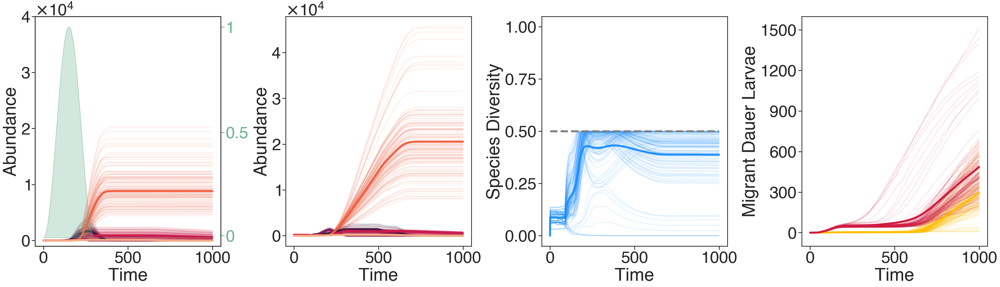

In [ ]:
folder_path = './output/stats/Jan2025/new_batch/EnA10_EnB0_EnC200_size101_mStep10_pPred0.005_period300_Tsim1000__Tlim300_equal_dauer_exitFalse'
    
    # List to store DataFrames
dataframes = []


cols = [(0.29215894, 0.76144162, 0.67886578), (0.95922872, 0.53307513, 0.3748895), 'dodgerblue']
count = 0
for file_name in os.listdir(folder_path):
    if file_name.endswith('.csv'):
        file_path = os.path.join(folder_path, file_name)
        # Read the CSV file and append the DataFrame to the list
        df = pd.read_csv(file_path)
        df['sim'] = count
        dataframes.append(df)
        count += 1
combined_df = pd.concat(dataframes, ignore_index=True)

combined_df = combined_df[combined_df['Strain'] != 'B']

combined_df["total"] = combined_df["E"] + combined_df["J"] + combined_df["A"] + combined_df["Dauer"] + combined_df["AJ"]

diversity_ind = pd.DataFrame()
for sim in combined_df["sim"].unique():
    sub1 = combined_df[combined_df["sim"]==sim]
    sub1 = sub1.iloc[3:]
    for time in sub1["Time"].unique():
        sub2 = sub1[sub1["Time"]==time]
        ind = np.round(simpsons_index(np.array(sub2['total'])), decimals=3)
        temp = pd.DataFrame({'sim': sim, 'Time': time, 'diversity_index': ind}, index=[0])
        diversity_ind = pd.concat([diversity_ind, temp], ignore_index=True)

name = 'fig3c'

fig, axes = plt.subplots(
    nrows=1,
    ncols=4,
    figsize=(35, 10),constrained_layout=True)

axes = axes.flatten()

# axes[0].errorbar(combined_df['Time'], combined_df['Resource'])

ax2 = axes[0].twinx()
#ax2.errorbar(combined_df['Time'], combined_df['Resource'])
ax2.fill_between(combined_df['Time'], combined_df['Resource'], 0, color=sns.color_palette("crest", n_colors=4)[0], alpha=0.3, zorder=0) 
ax2.tick_params(axis='y', which='both', color=sns.color_palette("crest", n_colors=4)[0], labelcolor=sns.color_palette("crest", n_colors=4)[0])
ax2.set_ylim(-0.04, 1.05)
ax2.set_yticks([0.01, 0.5, 1])
ax2.set_yticklabels([0, 0.5, 1])


for count, strain in enumerate(['A', 'C']):
    sub_df = combined_df[combined_df['Strain']==strain]
    sims = sub_df['sim'].unique()
    cols = sns.color_palette("rocket", n_colors=5)
    for col, dev in enumerate(['E', 'J', 'Dauer', 'AJ', 'A']):
        for i in sims:
            sub_df2 = sub_df[sub_df['sim']==i]
            axes[count].plot(sub_df2['Time'], sub_df2[dev], color=cols[col], alpha=0.1, zorder=1)
        if strain == 'A':
            axes[count].plot(sub_df.groupby('Time')[dev].mean(), color=cols[col], lw=5, zorder=4)
        else:
            axes[count].plot(sub_df.groupby('Time')[dev].mean(), color=cols[col], lw=5, zorder=4)
        
# axes[0].legend(frameon=False)
sims = sub_df['sim'].unique()
for i in sims:
    temp = diversity_ind[diversity_ind['sim']==i]
    axes[2].plot(temp['Time'], temp['diversity_index'], color='dodgerblue', alpha=0.1)
axes[2].plot(diversity_ind.groupby('Time')['diversity_index'].mean(), color='dodgerblue', lw=5, zorder=4)
axes[2].plot(temp['Time'], [0.5 for i in range(len(temp['Time']))], color='gray', ls='--', lw=5, zorder=4)
axes[2].set_yticks(np.linspace(0, 1, 5))
axes[2].set_ylim(-0.05, 1.05)

formatter = ticker.ScalarFormatter(useMathText=True)
formatter.set_powerlimits((0, 0))  # Force scientific notation at all magnitudes

# axes[1].set_yticks([0, 5000, 10000, 15000])
# axes[1].set_ylim(-500, 15000+500)

# axes[0].set_yticks(np.linspace(0, 15000, 4))

for ax in axes[:2]:
    #ax.ticklabel_format(style='sci', axis='y', scilimits=(0, 0))
    ax.yaxis.set_major_formatter(formatter)

 
cols = [(1.0, 0.75, 0.0), (0.36, 0.54, 0.66), (0.82, 0.1, 0.26)]
for count, strain in enumerate(['A','B', 'C']):
    if strain != "B":
        sub_df = combined_df[combined_df['Strain']==strain]
        sims = sub_df['sim'].unique()
        for i in sims:
            sub_df2 = sub_df[sub_df['sim']==i]
            axes[-1].plot(sub_df2['Time'], sub_df2['cum_migrated'],  color=cols[count], alpha=0.1, zorder=1)
        axes[-1].plot(sub_df.groupby('Time')['cum_migrated'].mean(), color=cols[count], lw=5, zorder=4)

for ax in axes:
    ax.set_xlabel('Time')

for ax in axes[:3]:
    ax.set_ylabel('Abundance')

axes[2].set_ylabel('Species Diversity')
axes[-1].set_ylabel('Migrant Dauer Larvae')

axes[0].set_yticks(np.linspace(0, 40000, 5))

axes[1].set_yticks(np.linspace(0, 40000, 5))

lg = axes[0].legend(loc=(0.7,0.6), frameon=False, markerscale=0, handlelength=0, handleheight=0.1, labelcolor='linecolor', prop={'weight':'normal', 'size':'small'})

axes[-1].set_yticks(np.linspace(0, 1500, 6))

axes[-1].set_ylim(-100, 1500+100)

plt.savefig('./fin_figures/'+name+'.pdf', bbox_inches='tight', dpi=200)
# plt.show()


In [ ]:
directory_path = "./output/stats/Jan2025"

# Get the list of folder names in the directory
folder_names = [name for name in os.listdir(directory_path) if os.path.isdir(os.path.join(directory_path, name))]

In [ ]:
folder_names

['new_batch',
 'EnA10_EnB10_EnC200_size101_mStep10_pPred0.005_period300_Tsim1000_depletionFalse',
 'EnA10_EnB10_EnC200_size101_mStep10_pPred0.005_period300_Tsim1000_depleteTrue_equal_dauer_exitTrue',
 'EnA10_EnB10_EnC200_size101_mStep10_pPred0.005_period300_Tsim1000_depletionTrue',
 'EnA200_EnB200_EnC200_size101_mStep10_pPred0.005_period300_Tsim1000_depletionTrue',
 'EnA10_EnB10_EnC0_size101_mStep10_pPred0.005_period300_Tsim1000_depleteTrue_equal_dauer_exitFalse']

/var/folders/b4/rkn0k8wd3cb6887fxs1vrp6m0007jh/T/ipykernel_52304/124212069.py:110: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  lg = axes[0].legend(loc=(0.7,0.6), frameon=False, markerscale=0, handlelength=0, handleheight=0.1, labelcolor='linecolor', prop={'weight':'normal', 'size':'small'})


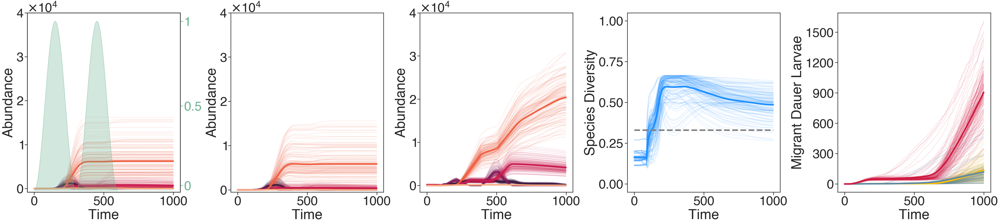

In [ ]:
folder_path = './output/stats/Jan2025/new_batch/EnA10_EnB10_EnC200_size101_mStep10_pPred0.005_period300_Tsim1000__Tlim600_equal_dauer_exitTrue'
    
    # List to store DataFrames
dataframes = []


cols = [(0.29215894, 0.76144162, 0.67886578), (0.95922872, 0.53307513, 0.3748895), 'dodgerblue']
count = 0
for file_name in os.listdir(folder_path):
    if file_name.endswith('.csv'):
        file_path = os.path.join(folder_path, file_name)
        # Read the CSV file and append the DataFrame to the list
        df = pd.read_csv(file_path)
        df['sim'] = count
        dataframes.append(df)
        count += 1
combined_df = pd.concat(dataframes, ignore_index=True)

combined_df["total"] = combined_df["E"] + combined_df["J"] + combined_df["A"] + combined_df["Dauer"] + combined_df["AJ"]

diversity_ind = pd.DataFrame()
for sim in combined_df["sim"].unique():
    sub1 = combined_df[combined_df["sim"]==sim]
    sub1 = sub1.iloc[3:]
    for time in sub1["Time"].unique():
        sub2 = sub1[sub1["Time"]==time]
        ind = np.round(simpsons_index(np.array(sub2['total'])), decimals=3)
        temp = pd.DataFrame({'sim': sim, 'Time': time, 'diversity_index': ind}, index=[0])
        diversity_ind = pd.concat([diversity_ind, temp], ignore_index=True)

name = 'fig4a'

fig, axes = plt.subplots(
    nrows=1,
    ncols=5,
    figsize=(45, 10),constrained_layout=True)

axes = axes.flatten()

# axes[0].errorbar(combined_df['Time'], combined_df['Resource'])

ax2 = axes[0].twinx()
#ax2.errorbar(combined_df['Time'], combined_df['Resource'])
ax2.fill_between(combined_df['Time'], combined_df['Resource'], 0, color=sns.color_palette("crest", n_colors=4)[0], alpha=0.3, zorder=0) 

ax2.tick_params(axis='y', which='both', color=sns.color_palette("crest", n_colors=4)[0], labelcolor=sns.color_palette("crest", n_colors=4)[0])
ax2.set_ylim(-0.01, 1.05)
ax2.set_yticks([0.03, 0.5, 1])
ax2.set_yticklabels([0, 0.5, 1])


for count, strain in enumerate(['A', 'B', 'C']):
    sub_df = combined_df[combined_df['Strain']==strain]
    sims = sub_df['sim'].unique()
    cols = sns.color_palette("rocket", n_colors=5)
    for col, dev in enumerate(['E', 'J', 'Dauer', 'AJ', 'A']):
        for i in sims:
            sub_df2 = sub_df[sub_df['sim']==i]
            axes[count].plot(sub_df2['Time'], sub_df2[dev], color=cols[col], alpha=0.1, zorder=1)
        if strain == 'A':
            axes[count].plot(sub_df.groupby('Time')[dev].mean(), color=cols[col], lw=5, zorder=4)
        else:
            axes[count].plot(sub_df.groupby('Time')[dev].mean(), color=cols[col], lw=5, zorder=4)
        
# axes[0].legend(frameon=False)
sims = sub_df['sim'].unique()
for i in sims:
    temp = diversity_ind[diversity_ind['sim']==i]
    axes[3].plot(temp['Time'], temp['diversity_index'], color='dodgerblue', alpha=0.1)
axes[3].plot(diversity_ind.groupby('Time')['diversity_index'].mean(), color='dodgerblue', lw=5, zorder=4)
axes[3].plot(temp['Time'], [0.33 for i in range(len(temp['Time']))], color='gray', ls='--', lw=5, zorder=4)
axes[3].set_yticks(np.linspace(0, 1, 5))
axes[3].set_ylim(-0.05, 1.05)

formatter = ticker.ScalarFormatter(useMathText=True)
formatter.set_powerlimits((0, 0))  # Force scientific notation at all magnitudes

axes[1].set_yticks([0, 5000, 10000, 15000])
axes[1].set_ylim(-500, 15000+500)

axes[0].set_yticks(np.linspace(0, 15000, 4))

for ax in axes[:3]:
    #ax.ticklabel_format(style='sci', axis='y', scilimits=(0, 0))
    ax.yaxis.set_major_formatter(formatter)

 
cols = [(1.0, 0.75, 0.0), (0.36, 0.54, 0.66), (0.82, 0.1, 0.26)]
for count, strain in enumerate(['A', 'B', 'C']):
    sub_df = combined_df[combined_df['Strain']==strain]
    sims = sub_df['sim'].unique()
    for i in sims:
        sub_df2 = sub_df[sub_df['sim']==i]
        axes[-1].plot(sub_df2['Time'], sub_df2['cum_migrated'],  color=cols[count], alpha=0.1, zorder=1)
    axes[-1].plot(sub_df.groupby('Time')['cum_migrated'].mean(), color=cols[count], lw=5, zorder=4)

for ax in axes:
    ax.set_xlabel('Time')

for ax in axes[:3]:
    ax.set_ylabel('Abundance')

axes[3].set_ylabel('Species Diversity')
axes[-1].set_ylabel('Migrant Dauer Larvae')

axes[0].set_yticks(np.linspace(0, 40000, 5))
axes[1].set_yticks(np.linspace(0, 40000, 5))
axes[2].set_yticks(np.linspace(0, 40000, 5))

lg = axes[0].legend(loc=(0.7,0.6), frameon=False, markerscale=0, handlelength=0, handleheight=0.1, labelcolor='linecolor', prop={'weight':'normal', 'size':'small'})

axes[-1].set_yticks(np.linspace(0, 1500, 6))

plt.savefig('./fin_figures/'+name+'.pdf', bbox_inches='tight', dpi=200)
#plt.show()


/var/folders/b4/rkn0k8wd3cb6887fxs1vrp6m0007jh/T/ipykernel_52304/659731991.py:110: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  lg = axes[0].legend(loc=(0.7,0.6), frameon=False, markerscale=0, handlelength=0, handleheight=0.1, labelcolor='linecolor', prop={'weight':'normal', 'size':'small'})


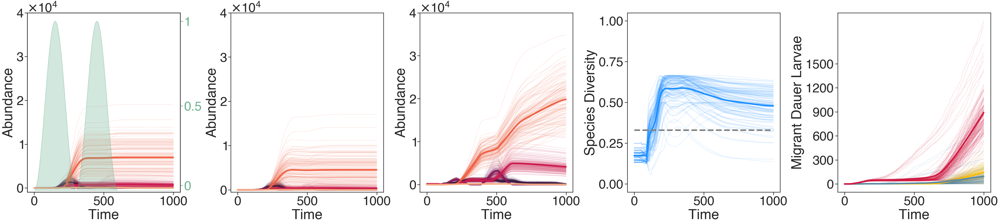

In [ ]:
folder_path = './output/stats/Jan2025/new_batch/EnA10_EnB10_EnC200_size101_mStep10_pPred0.005_period300_Tsim1000__Tlim600_equal_dauer_exitFalse'
    
    # List to store DataFrames
dataframes = []


cols = [(0.29215894, 0.76144162, 0.67886578), (0.95922872, 0.53307513, 0.3748895), 'dodgerblue']
count = 0
for file_name in os.listdir(folder_path):
    if file_name.endswith('.csv'):
        file_path = os.path.join(folder_path, file_name)
        # Read the CSV file and append the DataFrame to the list
        df = pd.read_csv(file_path)
        df['sim'] = count
        dataframes.append(df)
        count += 1
combined_df = pd.concat(dataframes, ignore_index=True)

combined_df["total"] = combined_df["E"] + combined_df["J"] + combined_df["A"] + combined_df["Dauer"] + combined_df["AJ"]

diversity_ind = pd.DataFrame()
for sim in combined_df["sim"].unique():
    sub1 = combined_df[combined_df["sim"]==sim]
    sub1 = sub1.iloc[3:]
    for time in sub1["Time"].unique():
        sub2 = sub1[sub1["Time"]==time]
        ind = np.round(simpsons_index(np.array(sub2['total'])), decimals=3)
        temp = pd.DataFrame({'sim': sim, 'Time': time, 'diversity_index': ind}, index=[0])
        diversity_ind = pd.concat([diversity_ind, temp], ignore_index=True)

name = 'fig4b'

fig, axes = plt.subplots(
    nrows=1,
    ncols=5,
    figsize=(45, 10),constrained_layout=True)

axes = axes.flatten()

# axes[0].errorbar(combined_df['Time'], combined_df['Resource'])

ax2 = axes[0].twinx()
#ax2.errorbar(combined_df['Time'], combined_df['Resource'])
ax2.fill_between(combined_df['Time'], combined_df['Resource'], 0, color=sns.color_palette("crest", n_colors=4)[0], alpha=0.3, zorder=0) 

ax2.tick_params(axis='y', which='both', color=sns.color_palette("crest", n_colors=4)[0], labelcolor=sns.color_palette("crest", n_colors=4)[0])
ax2.set_ylim(-0.01, 1.05)
ax2.set_yticks([0.03, 0.5, 1])
ax2.set_yticklabels([0, 0.5, 1])


for count, strain in enumerate(['A', 'B', 'C']):
    sub_df = combined_df[combined_df['Strain']==strain]
    sims = sub_df['sim'].unique()
    cols = sns.color_palette("rocket", n_colors=5)
    for col, dev in enumerate(['E', 'J', 'Dauer', 'AJ', 'A']):
        for i in sims:
            sub_df2 = sub_df[sub_df['sim']==i]
            axes[count].plot(sub_df2['Time'], sub_df2[dev], color=cols[col], alpha=0.1, zorder=1)
        if strain == 'A':
            axes[count].plot(sub_df.groupby('Time')[dev].mean(), color=cols[col], lw=5, zorder=4)
        else:
            axes[count].plot(sub_df.groupby('Time')[dev].mean(), color=cols[col], lw=5, zorder=4)
        
# axes[0].legend(frameon=False)
sims = sub_df['sim'].unique()
for i in sims:
    temp = diversity_ind[diversity_ind['sim']==i]
    axes[3].plot(temp['Time'], temp['diversity_index'], color='dodgerblue', alpha=0.1)
axes[3].plot(diversity_ind.groupby('Time')['diversity_index'].mean(), color='dodgerblue', lw=5, zorder=4)
axes[3].plot(temp['Time'], [0.33 for i in range(len(temp['Time']))], color='gray', ls='--', lw=5, zorder=4)
axes[3].set_yticks(np.linspace(0, 1, 5))
axes[3].set_ylim(-0.05, 1.05)

formatter = ticker.ScalarFormatter(useMathText=True)
formatter.set_powerlimits((0, 0))  # Force scientific notation at all magnitudes

axes[1].set_yticks([0, 5000, 10000, 15000])
axes[1].set_ylim(-500, 15000+500)

axes[0].set_yticks(np.linspace(0, 15000, 4))

for ax in axes[:3]:
    #ax.ticklabel_format(style='sci', axis='y', scilimits=(0, 0))
    ax.yaxis.set_major_formatter(formatter)

 
cols = [(1.0, 0.75, 0.0), (0.36, 0.54, 0.66), (0.82, 0.1, 0.26)]
for count, strain in enumerate(['A', 'B', 'C']):
    sub_df = combined_df[combined_df['Strain']==strain]
    sims = sub_df['sim'].unique()
    for i in sims:
        sub_df2 = sub_df[sub_df['sim']==i]
        axes[-1].plot(sub_df2['Time'], sub_df2['cum_migrated'],  color=cols[count], alpha=0.1, zorder=1)
    axes[-1].plot(sub_df.groupby('Time')['cum_migrated'].mean(), color=cols[count], lw=5, zorder=4)

for ax in axes:
    ax.set_xlabel('Time')

for ax in axes[:3]:
    ax.set_ylabel('Abundance')

axes[3].set_ylabel('Species Diversity')
axes[-1].set_ylabel('Migrant Dauer Larvae')

axes[0].set_yticks(np.linspace(0, 40000, 5))
axes[1].set_yticks(np.linspace(0, 40000, 5))
axes[2].set_yticks(np.linspace(0, 40000, 5))

lg = axes[0].legend(loc=(0.7,0.6), frameon=False, markerscale=0, handlelength=0, handleheight=0.1, labelcolor='linecolor', prop={'weight':'normal', 'size':'small'})

axes[-1].set_yticks(np.linspace(0, 1500, 6))

plt.savefig('./fin_figures/'+name+'.pdf', bbox_inches='tight', dpi=200)
#plt.show()


/var/folders/b4/rkn0k8wd3cb6887fxs1vrp6m0007jh/T/ipykernel_52304/3991379508.py:110: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  lg = axes[0].legend(loc=(0.7,0.6), frameon=False, markerscale=0, handlelength=0, handleheight=0.1, labelcolor='linecolor', prop={'weight':'normal', 'size':'small'})


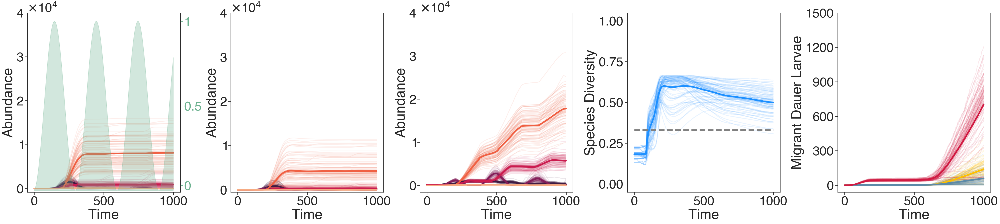

In [ ]:
folder_path = './output/stats/Jan2025/EnA10_EnB10_EnC200_size101_mStep10_pPred0.005_period300_Tsim1000_depletionFalse'
    
    # List to store DataFrames
dataframes = []


cols = [(0.29215894, 0.76144162, 0.67886578), (0.95922872, 0.53307513, 0.3748895), 'dodgerblue']
count = 0
for file_name in os.listdir(folder_path):
    if file_name.endswith('.csv'):
        file_path = os.path.join(folder_path, file_name)
        # Read the CSV file and append the DataFrame to the list
        df = pd.read_csv(file_path)
        df['sim'] = count
        dataframes.append(df)
        count += 1
combined_df = pd.concat(dataframes, ignore_index=True)

combined_df["total"] = combined_df["E"] + combined_df["J"] + combined_df["A"] + combined_df["Dauer"] + combined_df["AJ"]

diversity_ind = pd.DataFrame()
for sim in combined_df["sim"].unique():
    sub1 = combined_df[combined_df["sim"]==sim]
    sub1 = sub1.iloc[3:]
    for time in sub1["Time"].unique():
        sub2 = sub1[sub1["Time"]==time]
        ind = np.round(simpsons_index(np.array(sub2['total'])), decimals=3)
        temp = pd.DataFrame({'sim': sim, 'Time': time, 'diversity_index': ind}, index=[0])
        diversity_ind = pd.concat([diversity_ind, temp], ignore_index=True)

name = 'fig4c'

fig, axes = plt.subplots(
    nrows=1,
    ncols=5,
    figsize=(45, 10),constrained_layout=True)

axes = axes.flatten()

# axes[0].errorbar(combined_df['Time'], combined_df['Resource'])

ax2 = axes[0].twinx()
temp  = combined_df[(combined_df['sim'] == 0) & (combined_df['Strain'] == 'A')]
ax2.fill_between(temp['Time'], temp['Resource'], color=sns.color_palette("crest", n_colors=4)[0], alpha=0.3, zorder=0) 

ax2.tick_params(axis='y', which='both', color=sns.color_palette("crest", n_colors=4)[0], labelcolor=sns.color_palette("crest", n_colors=4)[0])
ax2.set_ylim(-0.01, 1.05)
ax2.set_yticks([0.03, 0.5, 1])
ax2.set_yticklabels([0, 0.5, 1])


for count, strain in enumerate(['A', 'B', 'C']):
    sub_df = combined_df[combined_df['Strain']==strain]
    sims = sub_df['sim'].unique()
    cols = sns.color_palette("rocket", n_colors=5)
    for col, dev in enumerate(['E', 'J', 'Dauer', 'AJ', 'A']):
        for i in sims:
            sub_df2 = sub_df[sub_df['sim']==i]
            axes[count].plot(sub_df2['Time'], sub_df2[dev], color=cols[col], alpha=0.1, zorder=1)
        if strain == 'A':
            axes[count].plot(sub_df.groupby('Time')[dev].mean(), color=cols[col], lw=5, zorder=4)
        else:
            axes[count].plot(sub_df.groupby('Time')[dev].mean(), color=cols[col], lw=5, zorder=4)
        
# axes[0].legend(frameon=False)
sims = sub_df['sim'].unique()
for i in sims:
    temp = diversity_ind[diversity_ind['sim']==i]
    axes[3].plot(temp['Time'], temp['diversity_index'], color='dodgerblue', alpha=0.1)
axes[3].plot(diversity_ind.groupby('Time')['diversity_index'].mean(), color='dodgerblue', lw=5, zorder=4)
axes[3].plot(temp['Time'], [0.33 for i in range(len(temp['Time']))], color='gray', ls='--', lw=5, zorder=4)
axes[3].set_yticks(np.linspace(0, 1, 5))
axes[3].set_ylim(-0.05, 1.05)

formatter = ticker.ScalarFormatter(useMathText=True)
formatter.set_powerlimits((0, 0))  # Force scientific notation at all magnitudes

axes[1].set_yticks([0, 5000, 10000, 15000])
axes[1].set_ylim(-500, 15000+500)

axes[0].set_yticks(np.linspace(0, 15000, 4))

for ax in axes[:3]:
    #ax.ticklabel_format(style='sci', axis='y', scilimits=(0, 0))
    ax.yaxis.set_major_formatter(formatter)

 
cols = [(1.0, 0.75, 0.0), (0.36, 0.54, 0.66), (0.82, 0.1, 0.26)]
for count, strain in enumerate(['A', 'B', 'C']):
    sub_df = combined_df[combined_df['Strain']==strain]
    sims = sub_df['sim'].unique()
    for i in sims:
        sub_df2 = sub_df[sub_df['sim']==i]
        axes[-1].plot(sub_df2['Time'], sub_df2['cum_migrated'],  color=cols[count], alpha=0.1, zorder=1)
    axes[-1].plot(sub_df.groupby('Time')['cum_migrated'].mean(), color=cols[count], lw=5, zorder=4)

for ax in axes:
    ax.set_xlabel('Time')

for ax in axes[:3]:
    ax.set_ylabel('Abundance')

axes[3].set_ylabel('Species Diversity')
axes[-1].set_ylabel('Migrant Dauer Larvae')

axes[0].set_yticks(np.linspace(0, 40000, 5))
axes[1].set_yticks(np.linspace(0, 40000, 5))
axes[2].set_yticks(np.linspace(0, 40000, 5))

lg = axes[0].legend(loc=(0.7,0.6), frameon=False, markerscale=0, handlelength=0, handleheight=0.1, labelcolor='linecolor', prop={'weight':'normal', 'size':'small'})

axes[-1].set_yticks(np.linspace(0, 1500, 6))

plt.savefig('./fin_figures/'+name+'.pdf', bbox_inches='tight', dpi=200)
#plt.show()


[Text(1, 0.03, '0'), Text(1, 0.5, '0.5'), Text(1, 1.0, '1')]

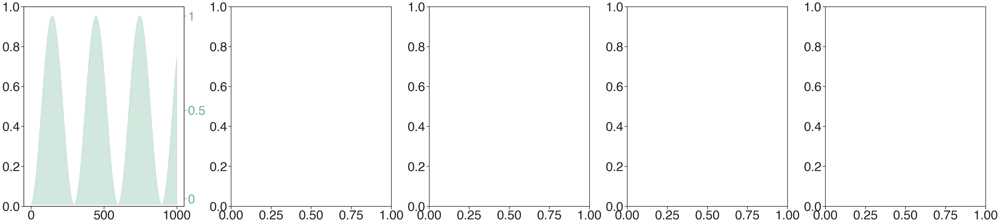

In [ ]:

fig, axes = plt.subplots(
    nrows=1,
    ncols=5,
    figsize=(45, 10),constrained_layout=True)

axes = axes.flatten()

# axes[0].errorbar(combined_df['Time'], combined_df['Resource'])

ax2 = axes[0].twinx()
temp  = combined_df[(combined_df['sim'] == 0) & (combined_df['Strain'] == 'A')]
ax2.fill_between(temp['Time'], temp['Resource'], color=sns.color_palette("crest", n_colors=4)[0], alpha=0.3, zorder=0) 

ax2.tick_params(axis='y', which='both', color=sns.color_palette("crest", n_colors=4)[0], labelcolor=sns.color_palette("crest", n_colors=4)[0])
ax2.set_ylim(-0.01, 1.05)
ax2.set_yticks([0.03, 0.5, 1])
ax2.set_yticklabels([0, 0.5, 1])

In [ ]:
combined_df[(combined_df['sim'] == 0) & (combined_df['Strain'] == 'A')]

,Unnamed: 0,E,J,A,Dead,Dauer,AJ,fE,fJ,fA,...,fDauer,fAJ,killed,cum_migrated,cum_migrated_f,Strain,Time,Resource,sim,total
0,0,0,0,0,0,17,0,0.0,0.0,0.0,...,0.070539,0.000000,0,0,0.000000,A,0,0.002739,0,17
3,0,0,0,0,0,17,0,0.0,0.0,0.0,...,0.070539,0.000000,0,0,0.000000,A,0,0.002739,0,17
6,0,0,0,0,0,17,0,0.0,0.0,0.0,...,0.070539,0.000000,0,0,0.000000,A,1,0.003943,0,17
9,0,0,0,0,0,17,0,0.0,0.0,0.0,...,0.070539,0.000000,0,0,0.000000,A,2,0.005364,0,17
12,0,0,0,0,0,17,0,0.0,0.0,0.0,...,0.070539,0.000000,0,0,0.000000,A,3,0.007002,0,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2988,0,0,0,0,111,1005,9952,0.0,0.0,0.0,...,0.136623,0.332365,0,182,0.175000,A,995,0.750000,0,10957
2991,0,0,0,0,111,1004,9952,0.0,0.0,0.0,...,0.136543,0.332320,0,183,0.175455,A,996,0.759014,0,10956
2994,0,0,0,0,111,1004,9952,0.0,0.0,0.0,...,0.136543,0.332287,0,183,0.175455,A,997,0.767913,0,10956
2997,0,0,0,0,111,1001,9952,0.0,0.0,0.0,...,0.136320,0.332254,0,186,0.176638,A,998,0.776696,0,10953


In [ ]:
combined_df = combined_df[combined_df['Strain'] != 'C']

In [ ]:
diversity_ind.groupby('Time')['diversity_index'].mean()

Time
0      0.000000
1      0.464609
2      0.464609
3      0.464609
4      0.464609
         ...   
995    0.312026
996    0.312026
997    0.312043
998    0.312043
999    0.312043
Name: diversity_index, Length: 1000, dtype: float64

In [ ]:
cols = ['#8B0000', '#FFD700', '#1B4F72']

In [ ]:
color = sns.color_palette("crest")[0]

In [ ]:
import matplotlib.colors as mcolors

In [ ]:
hex_color = mcolors.to_hex([x/255 for x in color])

In [ ]:
cols = sns.color_palette("rocket", n_colors=5)


In [ ]:
cols = sns.color_palette("tab10")

In [ ]:
cols[2]

(0.17254901960784313, 0.6274509803921569, 0.17254901960784313)

In [ ]:
    for col, dev in enumerate(['E', 'J', 'Dauer', 'AJ', 'A']):